In [72]:
import time as t
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

import transitspectroscopy as ts

from jwst import datamodels
from scipy.interpolate import splev, splrep

from pathlib import Path

from astropy.io import fits
from astropy.visualization import (ImageNormalize, SqrtStretch, PowerStretch, 
                                   SinhStretch,AsinhStretch)

In [2]:
sns.set_style('ticks')

# SOSS Trace Analysis
There are a few NIRISS/SOSS observations that can retrieve from the MAST database. I compiled a number a dataset from several Proposal programs (GO, ERS, and ERO). The goal of this analysis to determine the impact of pupil position angle has on the fitted SOSS traces. We use the `*rateints.fits` data products for this analysis.

In [3]:
# Define the path to where the data products are stored
jwst_data_paths = Path('../data/jwst/')


In [4]:
jwst_data_paths.absolute()

PosixPath('/Users/tbaines/Projects/niriss/soss/SOSS-Trace-Systematics/notebooks/../data/jwst')

In [5]:
list(jwst_data_paths.glob('[0-9]*'))

[PosixPath('../data/jwst/1541'),
 PosixPath('../data/jwst/2589'),
 PosixPath('../data/jwst/1538'),
 PosixPath('../data/jwst/1536'),
 PosixPath('../data/jwst/1366'),
 PosixPath('../data/jwst/1539'),
 PosixPath('../data/jwst/1091'),
 PosixPath('../data/jwst/2734')]

# Next lets load in the data and take a quick-look... 

In [10]:
# List to store our extracted data in. Data is sorted by proposal ID, 
# not by position angle of the pupil position this correction will be
# made later. 
results = dict(images=[], pwcpos=[], filenames=[])

verbose=True

# lood through our PID programs
for folder in sorted(jwst_data_paths.glob('[0-9]*')):
    print('PID program folder: ', folder)

    # Loop over the the program data products 
    for datafile in sorted(folder.glob('jw*')):
#         print('\t-', datafile.stem)
        
        # lets attempt to load the data using the jwst package
        # ran into issues before load data. Otherwise use astropy
        # fits to load in the data.
        try:
            tso_data = datamodels.open(datafile)
            pup_pos = tso_data.meta.instrument.pupil_position
            
            results['images'].append(tso_data.data.mean(axis=0))
            results['pwcpos'].append(pup_pos)
            results['filenames'].append(datafile.stem)
#             images.append([datafile.stem, tso_data.data.mean(axis=0)]) 
            if verbose:
                print(f'\tJWST DATAMODEL OPEN - {datafile.stem}')
        except:
            # need to add a few lines for extract pupil position?
            if verbose:
                print('\tFAILED OPEN JWST DATAMODEL WILL CONTINUE: ', datafile.stem)
            continue
            # Figure out why data model cannnot load certain data then 
            # write our own loader if need
            # with fits.open(datafile) as hdu:
            #     data = hdu[1].data
            #     print(data.shape)
            # if data.shape[-1] == 2048:  
            #     results.append([datafile.stem, data]) 

PID program folder:  ../data/jwst/1091
	- jw01091002001_03101_00001-seg001_nis_rateints
JWST DATAMODEL OPEN - jw01091002001_03101_00001-seg001_nis_rateints
	- jw01091002001_03101_00001-seg002_nis_rateints
JWST DATAMODEL OPEN - jw01091002001_03101_00001-seg002_nis_rateints
	- jw01091002001_03101_00001-seg003_nis_rateints
JWST DATAMODEL OPEN - jw01091002001_03101_00001-seg003_nis_rateints
	- jw01091002001_03101_00001-seg004_nis_rateints
JWST DATAMODEL OPEN - jw01091002001_03101_00001-seg004_nis_rateints
	- jw01091002001_03101_00001-seg005_nis_rateints
JWST DATAMODEL OPEN - jw01091002001_03101_00001-seg005_nis_rateints
PID program folder:  ../data/jwst/1366
	- jw01366001001_04101_00001-seg001_nis_rateints
JWST DATAMODEL OPEN - jw01366001001_04101_00001-seg001_nis_rateints
	- jw01366001001_04101_00001-seg002_nis_rateints
JWST DATAMODEL OPEN - jw01366001001_04101_00001-seg002_nis_rateints
	- jw01366001001_04101_00001-seg003_nis_rateints
JWST DATAMODEL OPEN - jw01366001001_04101_00001-seg003

In [14]:
print("Total number of data products: ", len(results['images']))

Total number of data products:  34


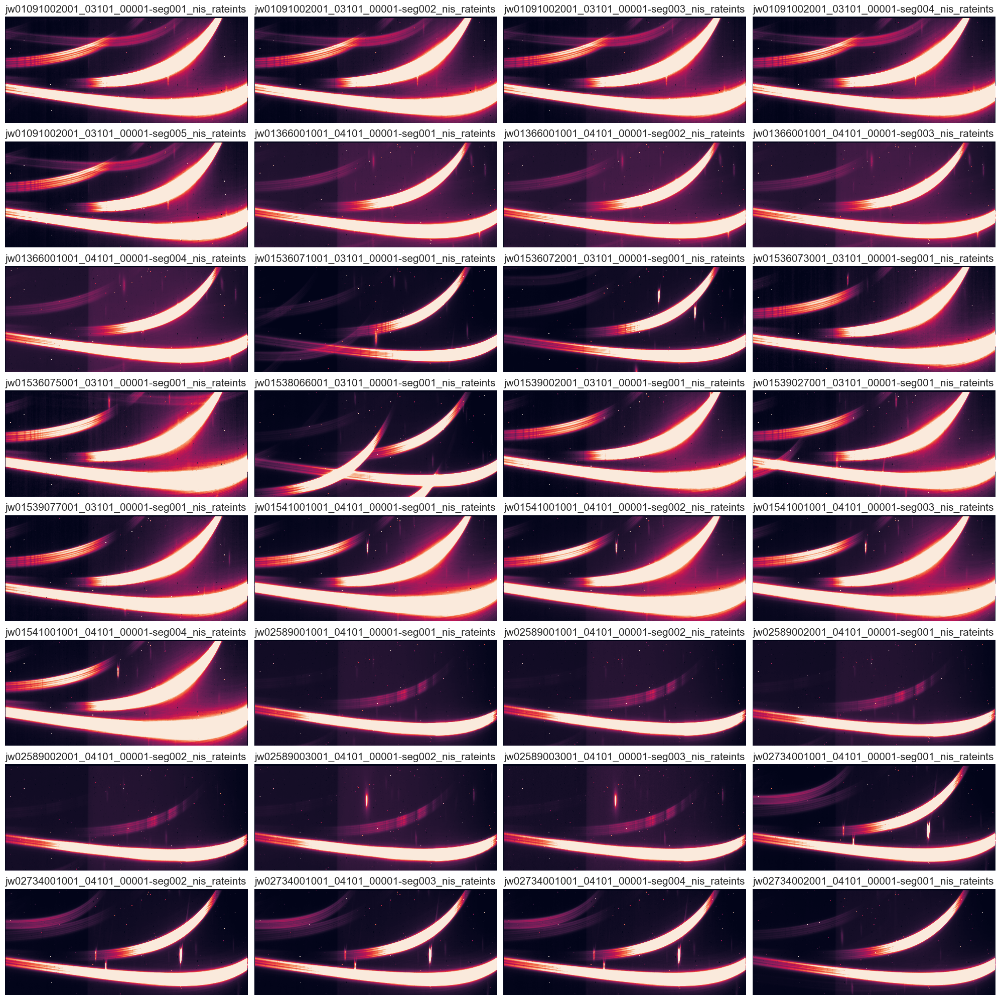

In [24]:
save_fig = False
pwcpos = []
ncols = 4
nrows = len(results['images'])//ncols
fig, axes = plt.subplots(nrows,ncols, figsize=(20,20), tight_layout=True, sharex=True, sharey=True)

for i, ax in enumerate(axes.ravel()):
    try:
        image, pwcpos, fname = results['images'][i], results['pwcpos'][i], results['filenames'][i]
        ax.set_title(fname, fontsize=15)
        ax.imshow(image, origin='lower', aspect='auto', vmin=2, vmax=30)
#         ax.annotate(245, 1900, r"$\theta_{pupil}="+f'{pwcpos:.3f}', fontsize=14)
    except:
        ax.axis('off')
if save_fig:
    plt.savefig('../figures/inspect_download_soss_data.jpg', dpi=200)
plt.show()

## Since some programs have a set observations with different observation IDs, we need to filter them into their respective groups (or segments) before proceeding. 

Before applying our filtering method lets run a test first.

We are going to implement our filtering method following the example found [here](https://stackoverflow.com/questions/24310945/group-items-by-string-pattern-in-python).

In [25]:
# here were going to use the itertools library groupby method. 
from itertools import groupby

In [26]:
# get all the files names from data set
filenames = results['filenames']

In [27]:
filenames[:3]

['jw01091002001_03101_00001-seg001_nis_rateints',
 'jw01091002001_03101_00001-seg002_nis_rateints',
 'jw01091002001_03101_00001-seg003_nis_rateints']

In [30]:
# proposal id folder paths
pid_folders = sorted(jwst_data_paths.glob('[0-9]*'))
pid_folders[0]

PosixPath('../data/jwst/1091')

In [31]:
files = list(pid_folders[0].glob('jw*'))
files[0]

PosixPath('../data/jwst/1091/jw01091002001_03101_00001-seg002_nis_rateints.fits')

In [32]:
files[0].stem.split('_')

['jw01091002001', '03101', '00001-seg002', 'nis', 'rateints']

In [33]:
# filter function
keyf = lambda text: text.split("_")[0]#.split("-")[1]
keyf(filenames[0])

'jw01091002001'

In [34]:
res = [list(items) for gr, items in groupby(filenames, key=keyf)]

In [36]:
# can see here that our observations are now grouped by their respective observation id
res[:3]

[['jw01091002001_03101_00001-seg001_nis_rateints',
  'jw01091002001_03101_00001-seg002_nis_rateints',
  'jw01091002001_03101_00001-seg003_nis_rateints',
  'jw01091002001_03101_00001-seg004_nis_rateints',
  'jw01091002001_03101_00001-seg005_nis_rateints'],
 ['jw01366001001_04101_00001-seg001_nis_rateints',
  'jw01366001001_04101_00001-seg002_nis_rateints',
  'jw01366001001_04101_00001-seg003_nis_rateints',
  'jw01366001001_04101_00001-seg004_nis_rateints'],
 ['jw01536071001_03101_00001-seg001_nis_rateints']]

## Lets collect our data.

We are going to iterate over the various observation programs some of which may have more than 1 observation (described the obsID) (using our filtering method from above). The data is divded into segments which we will join together to and extract the median frame along with the pupil position `PWCPOS`, and filter position `FILTPOS` (which may not be needed for this analysis).

In [37]:
# filtering function from above exercise.
keyf = lambda text: text.stem.split("_")[0]

# files that we deemed to be exclude from the final dataset
# which are due to poor traces
excluded_files = ['jw01538066001']

pid_tags = []
tso_data_results = []
pupil_positions_res = []
filter_positions_res = []

# we're going to iterate over the sorted program IDs 
for folder in sorted(jwst_data_paths.glob('[0-9]*')):
    print('Proposal ID data folder: ', folder)
    
    # as well as the sorted observation IDs
    sorted_folder = sorted(folder.glob('jw*'))
    filter_folder = [list(items) for gr, items in groupby(sorted_folder, key=keyf)]
    
    # Then loops through each of the segmented data sets
    for file_set in filter_folder:
        
        tso_seg_list = []
        pupil_positions = []
        filter_positions = []

        pid = None # Not sure why this is here

        # check if dataset is included into excluded list move onto to next
        if file_set[0].stem.split('_')[0] in excluded_files:
            print(f'JWST Data Excluded - {file.stem}')
            continue

        # Then loops through each of the segmented data sets and perform 
        # out data extraction
        for file in file_set:    
    
            pid=file.stem.split('_')[0]
            
            try:
                tso = datamodels.open(file)
                if verbose:
                    print(f'\tJWST DATAMODEL OPEN - {file.stem}')
                    
                pupil_pos = tso.meta.instrument.pupil_position
                filter_pos = tso.meta.instrument.filter_position

                tso_seg_list.append(tso.data)
                pupil_positions.append(pupil_pos)
                filter_positions.append(filter_pos)
            except:
                print(f'\tFAILED OPEN JWST DATAMODEL WILL CONTINUE - {file.stem}')
                continue


        # Join the segmented data, and extract the median 
        tso_data = np.vstack(tso_seg_list)
        tso_median = np.median(tso_data, axis=0)

        # Next we need to check that the pupil positions are all the same for a given set.
        # We will return all the pupil positions if it doesnt pass the condition check
        # to inspect where it failed and identify. Should be unlikely to fail but just in case. 
        pupil_position = pupil_positions[0] if np.all(pupil_positions) else pupil_positions
        filter_position = filter_positions[0] if np.all(filter_positions) else filter_positions
        
        # Append the data to the resulting array
        pid_tags.append(pid)
        tso_data_results.append(tso_median)
        pupil_positions_res.append(pupil_position) 
        filter_positions_res.append(filter_position)


Proposal ID data folder:  ../data/jwst/1091
JWST DATAMODEL OPEN - jw01091002001_03101_00001-seg001_nis_rateints
JWST DATAMODEL OPEN - jw01091002001_03101_00001-seg002_nis_rateints
JWST DATAMODEL OPEN - jw01091002001_03101_00001-seg003_nis_rateints
JWST DATAMODEL OPEN - jw01091002001_03101_00001-seg004_nis_rateints
JWST DATAMODEL OPEN - jw01091002001_03101_00001-seg005_nis_rateints
Proposal ID data folder:  ../data/jwst/1366
JWST DATAMODEL OPEN - jw01366001001_04101_00001-seg001_nis_rateints
JWST DATAMODEL OPEN - jw01366001001_04101_00001-seg002_nis_rateints
JWST DATAMODEL OPEN - jw01366001001_04101_00001-seg003_nis_rateints
JWST DATAMODEL OPEN - jw01366001001_04101_00001-seg004_nis_rateints
Proposal ID data folder:  ../data/jwst/1536
JWST DATAMODEL OPEN - jw01536071001_03101_00001-seg001_nis_rateints
JWST DATAMODEL OPEN - jw01536072001_03101_00001-seg001_nis_rateints
JWST DATAMODEL OPEN - jw01536073001_03101_00001-seg001_nis_rateints
JWST DATAMODEL OPEN - jw01536075001_03101_00001-seg0

### Lets check some of the statistics on the pupil positions

In [39]:
pupil_positions = np.array(pupil_positions_res, dtype=np.float32)
pwcpos_mean = np.mean(pupil_positions)
pwcpos_std = np.std(pupil_positions)

print('Total number of PWCPOS samples: ', pupil_positions.shape)
print(f'PWCPOS stats: {pwcpos_mean:.5f} $\pm$ {pwcpos_std:.5f}')

Total number of PWCPOS samples:  (15,)
PWCPOS stats: 245.82985 $\pm$ 0.08339


In [42]:
filter_positions = np.array(filter_positions_res)
filpos_mean = np.mean(filter_positions)
filpos_std = np.std(filter_positions)

print('Total number of FILPOS samples: ', pupil_positions.shape)
print(f'FILPOS stats: {filpos_mean:.5f} $\pm$ {filpos_std:.5f}')

Total number of FILPOS samples:  (15,)
FILPOS stats: 74.90439 $\pm$ 0.05950


In [43]:
print('All data set of same dimensions? :', np.all(list(map(np.shape, tso_data_results))))

All data set of same dimensions? : True


In [44]:
print(pid_tags)

['jw01091002001', 'jw01366001001', 'jw01536071001', 'jw01536072001', 'jw01536073001', 'jw01536075001', 'jw01539002001', 'jw01539027001', 'jw01539077001', 'jw01541001001', 'jw02589001001', 'jw02589002001', 'jw02589003001', 'jw02734001001', 'jw02734002001']


In [45]:
len(pupil_positions)

15

In [46]:
pupil_positions[pupil_positions.argsort()]

array([245.6809 , 245.68822, 245.71756, 245.75667, 245.7909 , 245.79822,
       245.8251 , 245.85933, 245.87889, 245.88622, 245.89844, 245.90578,
       245.918  , 245.92044, 245.92288], dtype=float32)

## Now that we have condensed our data down to single frames for analysis. Let take another look at the data.

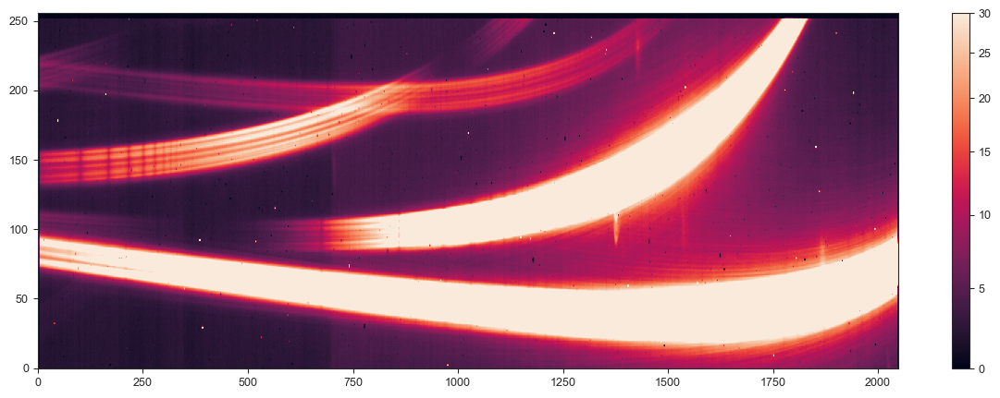

In [69]:
# stretch=PowerStretch(0.6)
# stretch=PowerStretch(1.2)
stretch=AsinhStretch(0.5)
norm = ImageNormalize(vmin=0, vmax=30, stretch=stretch)

plt.figure(figsize=(15,5))
plt.imshow(tso_data_results[0], origin='lower', aspect='auto', norm=norm)
plt.colorbar()
plt.show()

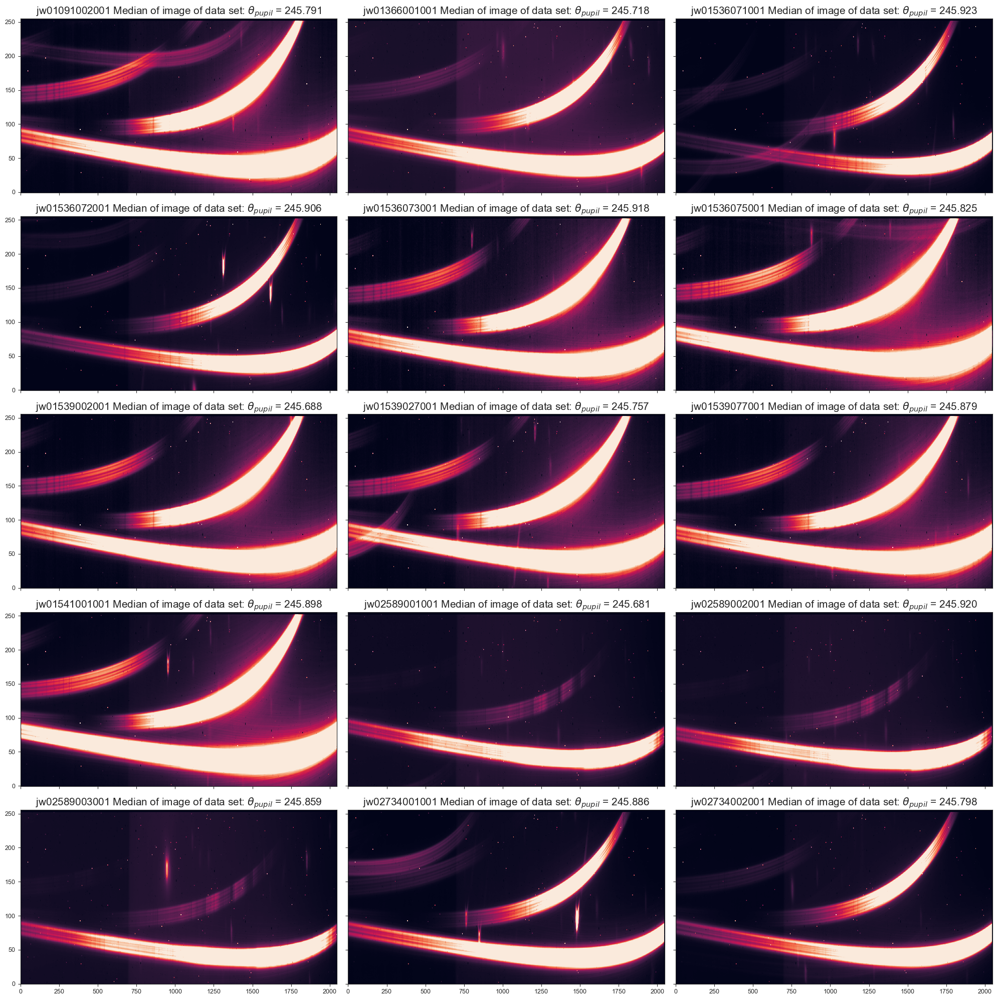

In [70]:
save_fig = False

norm = ImageNormalize(vmin=2, vmax=50, stretch=stretch)

ncols = 3
nrows = len(tso_data_results)//ncols

fig, axes = plt.subplots(nrows, ncols, figsize=(20,20), tight_layout=True, sharex=True, sharey=True)

for i, ax in enumerate(axes.ravel()):
    try:
        tso = tso_data_results[i]
        title = f'{pid_tags[i]} '+'Median of image of data set: $\\theta_{pupil}$ = ' + f'{pupil_positions_res[i]:.3f}'
        ax.set_title(title, fontsize=15)
#         ax.imshow(tso, origin='lower', aspect='auto', vmin=2, vmax=30)
        ax.imshow(tso, origin='lower', aspect='auto', norm=norm)
    except:
        ax.axis('off')
if save_fig:
    plt.savefig('../figures/median_set_soss_data.jpg', dpi=200)
plt.show()

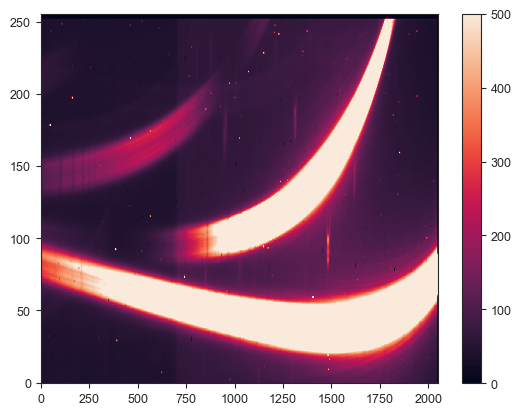

In [71]:
mean_tso_data_res = np.sum(tso_data_results, axis=0)
plt.imshow(mean_tso_data_res, origin='lower', aspect='auto',vmin=0, vmax=500)
plt.colorbar()
plt.show()

# Next, lets trace the spectra for Order 1, 2, and 3 for each of our sample images.

In [73]:
ccf_parameters = [-7.5, 3.0, 7.5, 3.0]

# spline knots
x_knots1 = [[6, 1200-5], [1200, 1500-5], [1500, 1700-5],[1700, 2041]]
nknots1 = [4,2,3,4]

x_knots2 = [[601, 850-5], [850, 1100-5],[1100,1749]]
nknots2 = [2, 2, 5]

# empty list to store the results of each of our traces.
traces_results = []
display = False
t_start = t.time()
for i, median_tso in enumerate(tso_data_results):
    t1 = t.time()
    print(f'Calculate the traces for {pid_tags[i]}')
    
    lags1, ccf1 = ts.spectroscopy.get_ccf(np.arange(median_tso.shape[0]), median_tso[:, 2035], 
                                         function = 'double gaussian', parameters = ccf_parameters,)

    lags2, ccf2 = ts.spectroscopy.get_ccf(np.arange(median_tso.shape[0]), median_tso[:, 1750], 
                                             function = 'double gaussian', parameters = ccf_parameters)

    lags3, ccf3 = ts.spectroscopy.get_ccf(np.arange(median_tso.shape[0]), median_tso[:, 900], 
                                             function = 'double gaussian', parameters = ccf_parameters)
    
    # 1
    idx = np.where(np.max(ccf1) == ccf1)[0]
    ystart1 = lags1[idx][0]
    # 2
    idx_large = np.where(lags2>200)[0]
    ccf2 = np.array(ccf2)
    idx = np.where( np.max(ccf2[idx_large]) == ccf2[idx_large] )[0]
    ystart2 = lags2[idx_large][idx][0]
    # 3
    idx_large = np.where(lags3>150)[0]
    ccf3 = np.array(ccf3)
    idx = np.where( np.max(ccf3[idx_large]) == ccf3[idx_large] )[0]
    ystart3 = lags3[idx_large][idx][0]
    
    if display:
        fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(15,5), tight_layout=True)
        # order 1
        ax1.plot(lags1, ccf1)
        ax1.set_xlim(30,150)
        ax1.plot([ystart1, ystart1], [0, np.max(ccf1)], 'r--')
        # order 2
        ax2.plot(lags2, ccf2)
        ax2.plot([ystart2, ystart2], [0, np.max(ccf2)], 'r--')
        # order 3
        ax3.plot(lags3, ccf3)
        ax3.plot([ystart3, ystart3], [0, np.max(ccf3)], 'r--')
        ax3.set_ylim(0,100)
        plt.show()
        
    
    # Trace the orders:
    # Order1
    x1, y1 = ts.spectroscopy.trace_spectrum(median_tso, 
                                        np.zeros(median_tso.shape), 
                                        xstart = 2043, 
                                        ystart = ystart1, 
                                        xend = 4, 
                                        ccf_function = 'double gaussian', 
                                        ccf_parameters = ccf_parameters)
    
    x2_end, x2_start = 600, 1750

    x2, y2 = ts.spectroscopy.trace_spectrum(median_tso, 
                                            np.zeros(median_tso.shape), 
                                            xstart = x2_start, ystart = ystart2, xend = x2_end, 
                                            ccf_function = 'double gaussian', 
                                            ccf_parameters = ccf_parameters, 
                                            y_tolerance = 4)
    
    x3_end, x3_start = 4, 900

    x3, y3 = ts.spectroscopy.trace_spectrum(median_tso, np.zeros(median_tso.shape), 
                                            xstart = x3_start, ystart = ystart3, xend = x3_end, 
                                            ccf_function = 'double gaussian', 
                                            ccf_parameters = ccf_parameters, 
                                            y_tolerance = 4)
    
    _, sfit1 = ts.utils.fit_spline(x1, y1, nknots = nknots1, x_knots = x_knots1)
    _, sfit2 = ts.utils.fit_spline(x2, y2, nknots = nknots2, x_knots = x_knots2)
    _, sfit3 = ts.utils.fit_spline(x3, y3, nknots = 10)
    
    # append the results results
    traces_results.append([[x1, sfit1], [x2, sfit2], [x3, sfit3]])
    
    print(f"Elapsed Time to compute trace - {t.time() - t1} s")
print(f"Elapsed Time to compute all traces - {t.time() - t_start} s")

Calculate the traces for jw01091002001
Elapsed Time to compute trace - 46.26581811904907 s
Calculate the traces for jw01366001001
Elapsed Time to compute trace - 46.43746089935303 s
Calculate the traces for jw01536071001
Elapsed Time to compute trace - 47.49883699417114 s
Calculate the traces for jw01536072001
Elapsed Time to compute trace - 47.248294830322266 s
Calculate the traces for jw01536073001
Elapsed Time to compute trace - 46.36258101463318 s
Calculate the traces for jw01536075001
Elapsed Time to compute trace - 47.29558205604553 s
Calculate the traces for jw01539002001
Elapsed Time to compute trace - 47.250640869140625 s
Calculate the traces for jw01539027001
Elapsed Time to compute trace - 47.58903908729553 s
Calculate the traces for jw01539077001
Elapsed Time to compute trace - 47.33571100234985 s
Calculate the traces for jw01541001001
Elapsed Time to compute trace - 46.60001492500305 s
Calculate the traces for jw02589001001
Elapsed Time to compute trace - 47.00076389312744

Overplot traces onto images.

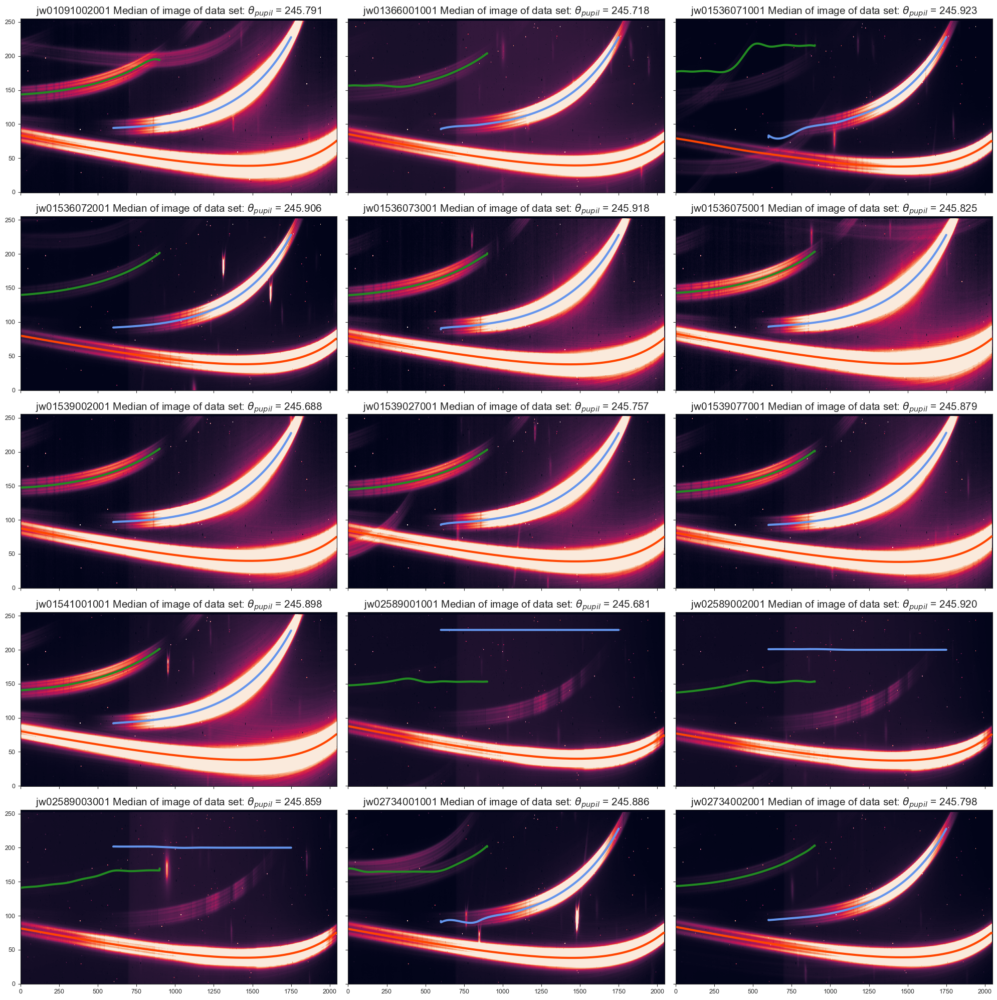

In [74]:
save_fig = False

fig, axes = plt.subplots(5,3, figsize=(20,20), tight_layout=True, sharex=True, sharey=True)

for i, ax in enumerate(axes.ravel()):
    try:
        tso = tso_data_results[i]
        title = f'{pid_tags[i]} '+'Median of image of data set: $\\theta_{pupil}$ = ' + f'{pupil_positions_res[i]:.3f}'
        ax.set_title(title, fontsize=15)
#         ax.imshow(tso, origin='lower', aspect='auto', vmin=2, vmax=30)
        ax.imshow(tso, origin='lower', aspect='auto', norm=norm)

        order1, order2, order3 = traces_results[i]
        x1, y1 = order1
        x2, y2 = order2
        x3, y3 = order3

        ax.plot(x1, y1, color = 'orangered', lw = 3)
        ax.plot(x2, y2, color = 'cornflowerblue', lw = 3)
        ax.plot(x3, y3, color = 'forestgreen', lw = 3)

    except:
        ax.axis('off')
if save_fig:
    plt.savefig('../figures/median_set_soss_data_w_traces.jpg', dpi=200)

plt.show()

# Finally lets write the traces to a files

In [75]:
import pandas as pd

In [160]:
res_dict = {}
for i in range(len(pid_tags)):
    res_dict[pid_tags[i]] = {'pwcpos': pupil_positions[i],
                             'filpos': filter_positions[i],
                             'traces': {
                                'ORDER 1': {'x':traces_results[i][0][0], 'y': traces_results[i][0][1]},
                                'ORDER 2': {'x':traces_results[i][1][0], 'y': traces_results[i][1][1]},
                                'ORDER 3': {'x':traces_results[i][2][0], 'y': traces_results[i][2][1]} 
                             }
                            }

df = pd.DataFrame.from_dict(res_dict, orient='index')
df.to_json('../outputs/soss_traces_raw.json')

In [206]:
x_traces_o1 = traces_results[0][0][0]
y_traces_o1 = [traces_results[i][0][1] for i in range(len(pid_tags))]
traces_o1 = np.vstack([x_traces_o1, *y_traces_o1]).T

x_traces_o2 = traces_results[0][1][0]
y_traces_o2 = [traces_results[i][1][1] for i in range(len(pid_tags))]
traces_o2 = np.vstack([x_traces_o2, *y_traces_o2]).T

x_traces_o3 = traces_results[0][2][0]
y_traces_o3 = [traces_results[i][2][1] for i in range(len(pid_tags))]
traces_o3 = np.vstack([x_traces_o3, *y_traces_o3]).T

c1 = fits.Column(name='pid', array=pid_tags, format='20A')
c2 = fits.Column(name='pwcpos', array=pupil_positions, format='E')
c3 = fits.Column(name='filpos', array=filter_positions, format='E')

# >>> t = fits.BinTableHDU.from_columns([c1, c2, c3])

In [211]:
traces_o1.shape

(2040, 16)

In [214]:
np.asarray(tso_data_results).shape

(15, 256, 2048)

In [217]:
# save the images to fits file. How the data is stored can be discussed with team for now
# just saving it as a simple fits file. 

overwrite=True
outfits = fits.HDUList([
    fits.PrimaryHDU(np.asarray(tso_data_results)), # images
    fits.BinTableHDU.from_columns([c1, c2, c3]), # generic info
    fits.ImageHDU(traces_o1), # order 1 traces
    fits.ImageHDU(traces_o2), # order 2 traces
    fits.ImageHDU(traces_o3), # order 3 traces 
])

outfits.writeto('../outputs/jwst_soss_obs_filtered_med_rateints.fits', overwrite=overwrite)

This marks the end of this Notebook. The goal here is do data reduction and trace measurements and save those results to a file which can then be process through an analysis pipeline. Next is notebook 03-Trace-Analysis.